In [2]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import random

In [3]:
org_data_list=[]
file_names=['2006-05-13.csv','2006-05-14.csv','2006-05-15.csv','2006-05-16.csv','2006-05-17.csv', '2006-05-18.csv','2006-05-19.csv','2007-12-14.csv','2009-05-05.csv','2011-11-01.csv']

for f in file_names:
    data=pd.read_csv('data/raw_data/'+f)
    if f in ['2007-12-14.csv','2009-05-05.csv','2011-11-01.csv']:
        q25,q75=np.quantile(data['SJS13'],[0.25,0.75])
        print(q25-1.5*(q75-q25),q75+1.5*(q75-q25))
        data['SJS13'][data['SJS13']<q25-1.5*(q75-q25)]=np.nan#3000
        data['SJS13'][data['SJS13']>q75+1.5*(q75-q25)]=np.nan#2700
    data=data.interpolate(method='linear')
    data=data.iloc[90:-90]
    print(data.shape)
    org_data_list.append(data)

(172620, 14)
(172620, 14)
(172620, 14)
(172620, 14)
(172620, 14)
(172620, 14)
(172620, 14)
2774.862492801036 2860.8972732559014
(172620, 14)
2785.931150398128 2869.0900732652844
(172620, 14)
2732.015028449452 2869.1944270294844
(172620, 14)


In [4]:
data_list=[]
file_names=['2006-05-13.csv','2006-05-14.csv','2006-05-15.csv','2006-05-16.csv','2006-05-17.csv', '2006-05-18.csv','2006-05-19.csv','2007-12-14.csv','2009-05-05.csv','2011-11-01.csv']

for f in file_names:
    data=pd.read_csv('data/raw_data/'+f)
    data = data.drop(['SJX08','SJX13'],axis=1)
    if f in ['2007-12-14.csv','2009-05-05.csv','2011-11-01.csv']:
        q25,q75=np.quantile(data['SJS13'],[0.25,0.75])
        print(q25-1.5*(q75-q25),q75+1.5*(q75-q25))
        data['SJS13'][data['SJS13']<q25-1.5*(q75-q25)]=np.nan#3000
        data['SJS13'][data['SJS13']>q75+1.5*(q75-q25)]=np.nan#2700
    data=data.interpolate(method='linear')
    data=data.iloc[90:-90]
    print(data.shape)
    data_list.append(data)

(172620, 12)
(172620, 12)
(172620, 12)
(172620, 12)
(172620, 12)
(172620, 12)
(172620, 12)
2774.862492801036 2860.8972732559014
(172620, 12)
2785.931150398128 2869.0900732652844
(172620, 12)
2732.015028449452 2869.1944270294844
(172620, 12)


In [5]:
pre_data_list=[]
file_names=['2006-05-13.csv','2006-05-14.csv','2006-05-15.csv','2006-05-16.csv','2006-05-17.csv', '2006-05-18.csv','2006-05-19.csv','2007-12-14.csv','2009-05-05.csv','2011-11-01.csv']

for f in file_names:
    data=pd.read_csv('data/raw_data/'+f)
    data = data.drop(['SJS08', 'SJS13', 'SJX08','SJX13'],axis=1)
    print(data.shape)
    pre_data_list.append(data)

(172800, 10)
(172800, 10)
(172800, 10)
(172800, 10)
(172800, 10)
(172800, 10)
(172800, 10)
(172800, 10)
(172800, 10)
(172800, 10)


In [6]:
file_names=['2006-05-13','2006-05-14','2006-05-15','2006-05-16','2006-05-17', '2006-05-18','2006-05-19','2007-12-14','2009-05-05','2011-11-01']
org_cable_title = ["SJS08", "SJS09", "SJS10", "SJS11", "SJS12", "SJS13", "SJS14", "SJX08", "SJX09", "SJX10", "SJX11", "SJX12", "SJX13", "SJX14"]
cable_title = ["SJS08", "SJS09", "SJS10", "SJS11", "SJS12", "SJS13", "SJS14", "SJX09", "SJX10", "SJX11", "SJX12", "SJX14"]
pre_cable_title = ["SJS09", "SJS10", "SJS11", "SJS12", "SJS14", "SJX09", "SJX10", "SJX11", "SJX12", "SJX14"]

In [7]:
datas = org_data_list.copy()
for i, data in enumerate(datas):
    data = data.values
    data = np.transpose(data)
    datas[i] = data
org_cable_data = datas
org_cable_data = np.array(org_cable_data)
org_cable_data.shape

(10, 14, 172620)

In [8]:
datas = data_list.copy()
for i, data in enumerate(datas):
    data = data.values
    data = np.transpose(data)
    datas[i] = data
cable_data = datas
cable_data = np.array(cable_data)
cable_data.shape

(10, 12, 172620)

In [9]:
datas = pre_data_list.copy()
for i, data in enumerate(datas):
    data = data.values
    data = np.transpose(data)
    datas[i] = data
pre_cable_data = datas
pre_cable_data = np.array(pre_cable_data)
pre_cable_data.shape

(10, 10, 172800)

In [10]:
def plot_data_by_cable(length, data, title):
    for i in range(length):
        fig, ax = plt.subplots(2, 5, figsize=(30,5))
        num = 0
        for j in range(2):
            for k in range(5):
                idx = num
                num += 1
                
                ax[j][k].set_title(file_names[idx])
                ax[j][k].plot(data[idx][i])
        plt.suptitle(title[i], fontsize=20)
        plt.tight_layout()
        plt.show()

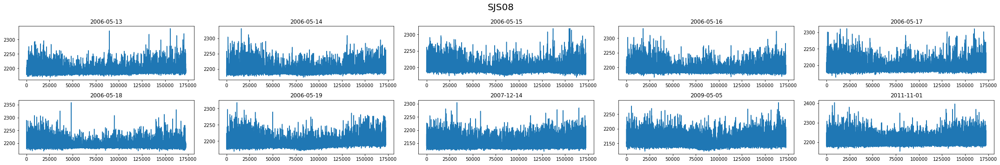

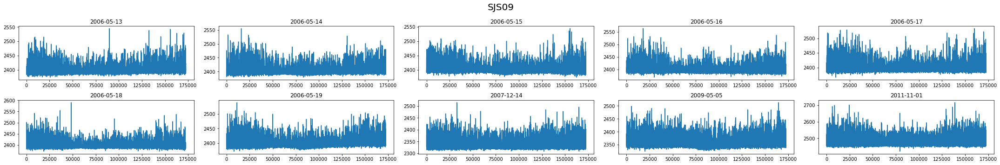

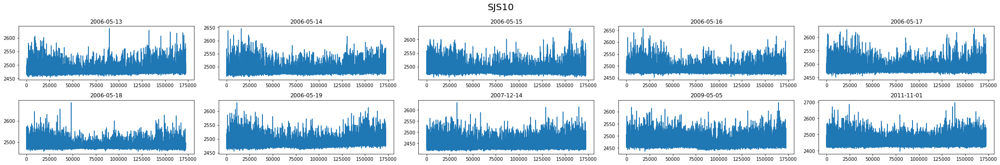

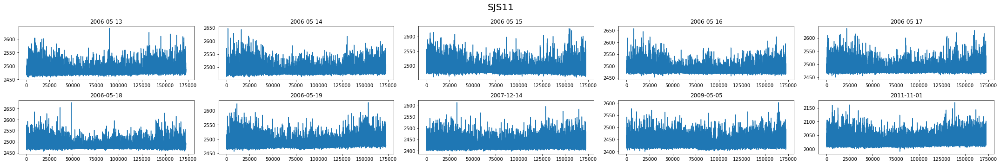

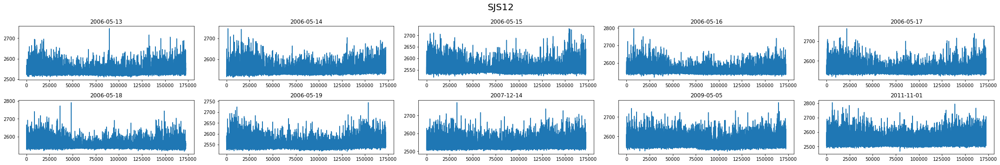

...

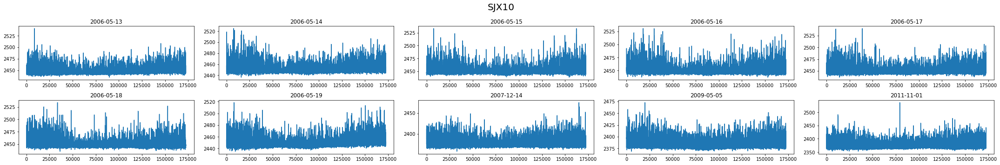

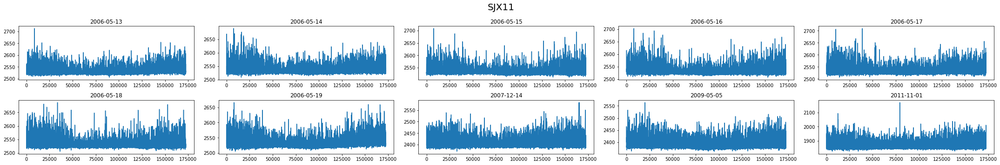

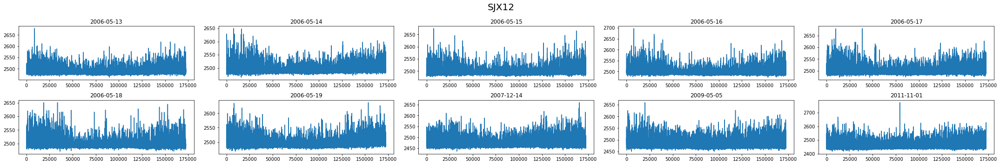

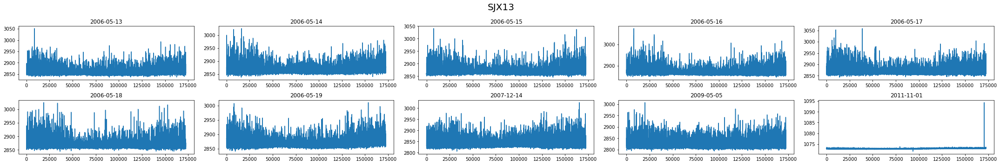

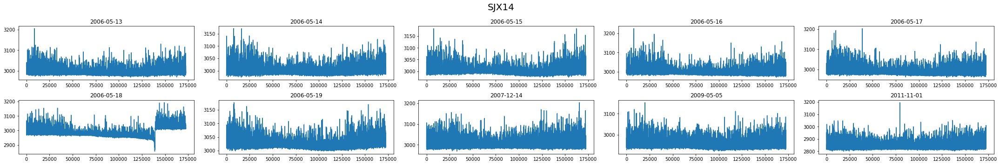

In [11]:
plot_data_by_cable(14, org_cable_data, org_cable_title)

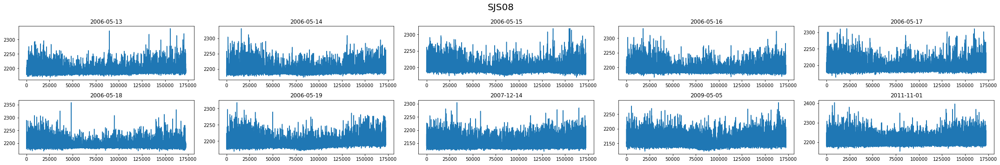

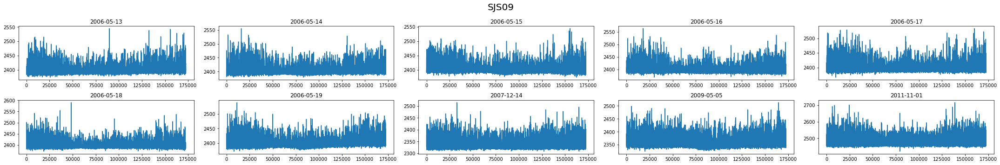

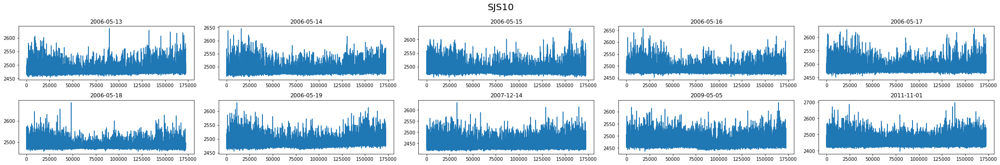

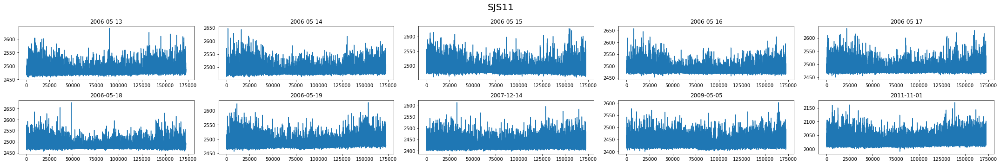

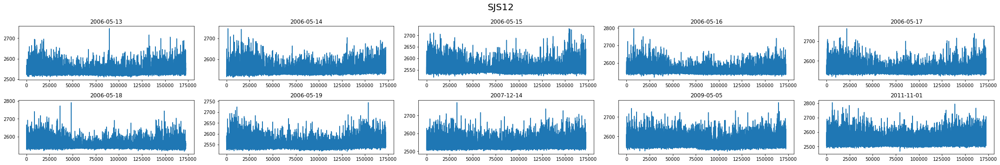

...

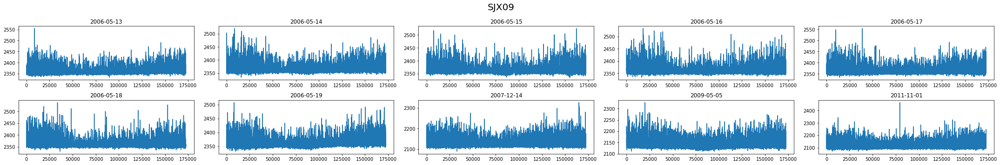

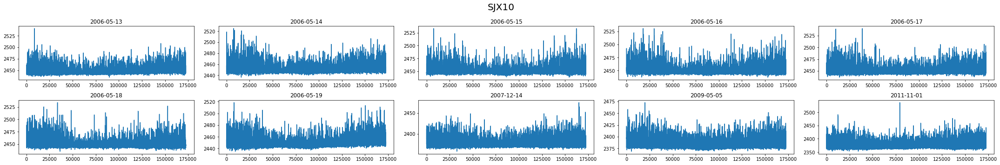

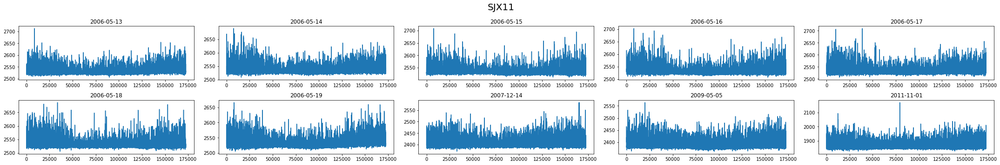

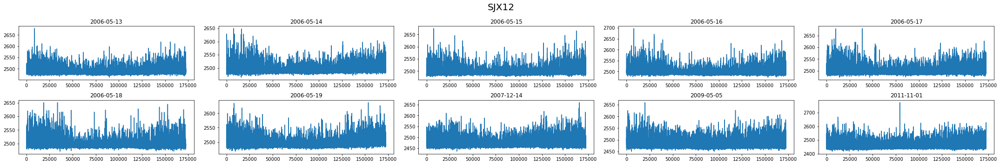

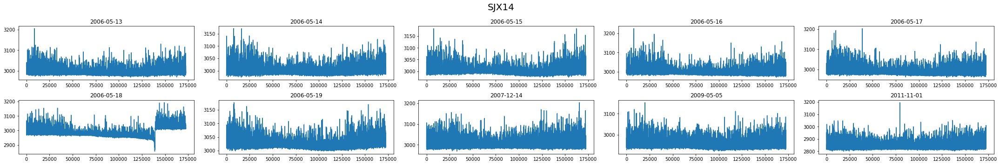

In [12]:
plot_data_by_cable(12, cable_data, cable_title)

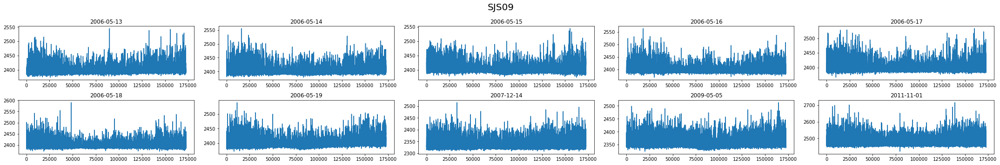

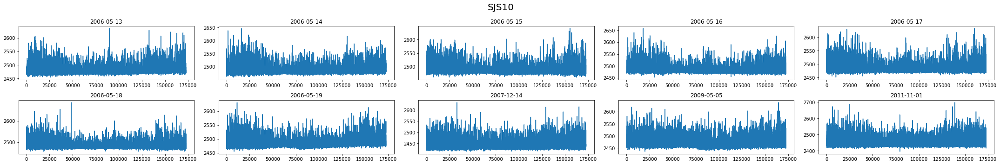

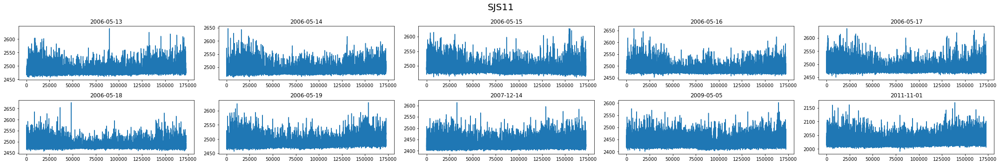

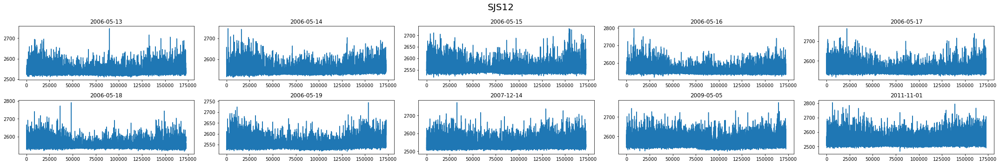

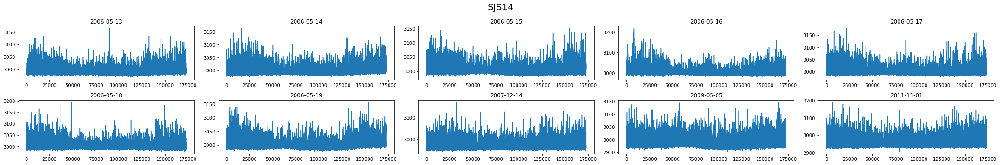

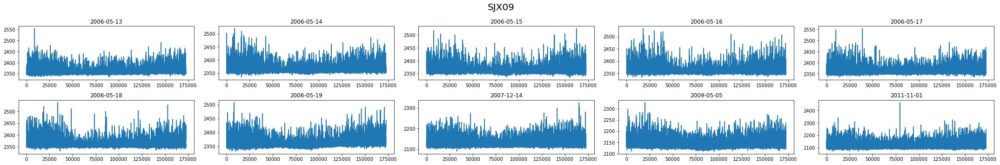

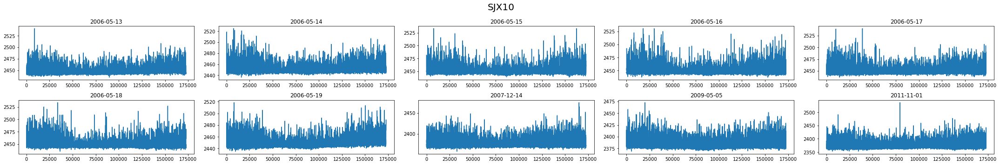

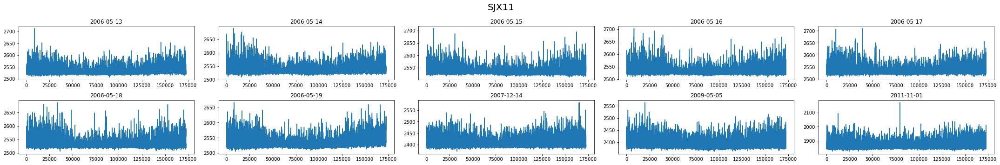

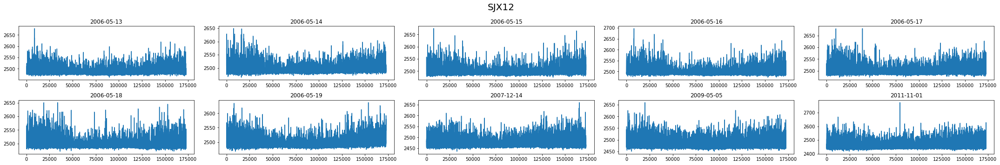

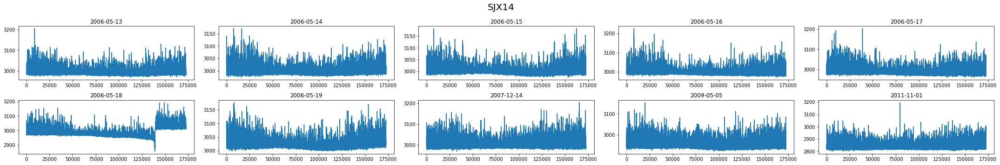

In [13]:
plot_data_by_cable(10, pre_cable_data, pre_cable_title)

In [14]:
from scipy.signal import find_peaks
from scipy.ndimage import median_filter

In [15]:
def make_nan_array(length, index_list, values):
    data = np.empty(length)
    data[:] = np.nan
    np.put(data, index_list, values)
    idx = np.argwhere(~np.isnan(data))[0][0]
    data[0] = data[idx]
    return data

In [16]:
def preprocess(data):
    peaks, _ = find_peaks(data, height=(np.mean(data) - np.std(data), np.mean(data) + np.std(data)))
    peak_data = make_nan_array(len(data), peaks, data[peaks])
    peak = data[peaks]
    median_peak = median_filter(peak, 50)
    median_peak_data = make_nan_array(len(data), peaks, median_peak)
    
    inter = pd.Series(median_peak_data).interpolate()
    rolling = pd.Series(inter).rolling(1200, min_periods=1).mean()

    return rolling, data - rolling

In [17]:
org_cable_rolling = []
org_cable_diff_rolling = []
for i in range(org_cable_data.shape[0]):
    org_rolling_datas = []
    org_diff_rolling_datas = []
    for j in range(org_cable_data.shape[1]):
        org_rollings = []
        org_data_rollings = []
        for k in range(24):
            org_data = org_cable_data[i][j][k*7200:(k+1)*7200]
            org_rolling, org_data_rolling = preprocess(org_data)
            org_rollings.append(org_rolling)
            org_data_rollings.append(org_data_rolling)
        org_rolling = np.concatenate(org_rollings)
        org_data_rolling = np.concatenate(org_data_rollings)
        org_rolling_datas.append(org_rolling)
        org_diff_rolling_datas.append(org_data_rolling)
    org_rolling_datas = np.array(org_rolling_datas)
    org_diff_rolling_datas = np.array(org_diff_rolling_datas)
    org_cable_rolling.append(org_rolling_datas)
    org_cable_diff_rolling.append(org_diff_rolling_datas)
    print(org_rolling_datas.shape, org_diff_rolling_datas.shape)
org_cable_rolling = np.array(org_cable_rolling)
org_cable_diff_rolling = np.array(org_cable_diff_rolling)
org_cable_rolling.shape, org_cable_diff_rolling.shape

(14, 172620) (14, 172620)
(14, 172620) (14, 172620)
(14, 172620) (14, 172620)
(14, 172620) (14, 172620)
(14, 172620) (14, 172620)
(14, 172620) (14, 172620)
(14, 172620) (14, 172620)
(14, 172620) (14, 172620)
(14, 172620) (14, 172620)
(14, 172620) (14, 172620)


((10, 14, 172620), (10, 14, 172620))

In [18]:
cable_rolling = []
cable_diff_rolling = []
for i in range(cable_data.shape[0]):
    rolling_datas = []
    diff_rolling_datas = []
    for j in range(cable_data.shape[1]):
        rollings = []
        data_rollings = []
        for k in range(24):
            data = cable_data[i][j][k*7200:(k+1)*7200]
            rolling, data_rolling = preprocess(data)
            rollings.append(rolling)
            data_rollings.append(data_rolling)
        rolling = np.concatenate(rollings)
        data_rolling = np.concatenate(data_rollings)
        rolling_datas.append(rolling)
        diff_rolling_datas.append(data_rolling)
    rolling_datas = np.array(rolling_datas)
    diff_rolling_datas = np.array(diff_rolling_datas)
    cable_rolling.append(rolling_datas)
    cable_diff_rolling.append(diff_rolling_datas)
    print(rolling_datas.shape, diff_rolling_datas.shape)
cable_rolling = np.array(cable_rolling)
cable_diff_rolling = np.array(cable_diff_rolling)
cable_rolling.shape, cable_diff_rolling.shape

(12, 172620) (12, 172620)
(12, 172620) (12, 172620)
(12, 172620) (12, 172620)
(12, 172620) (12, 172620)
(12, 172620) (12, 172620)
(12, 172620) (12, 172620)
(12, 172620) (12, 172620)
(12, 172620) (12, 172620)
(12, 172620) (12, 172620)
(12, 172620) (12, 172620)


((10, 12, 172620), (10, 12, 172620))

In [19]:
pre_cable_rolling = []
pre_cable_diff_rolling = []
for i in range(pre_cable_data.shape[0]):
    pre_rolling_datas = []
    pre_diff_rolling_datas = []
    for j in range(pre_cable_data.shape[1]):
        pre_rollings = []
        pre_data_rollings = []
        for k in range(24):
            pre_data = pre_cable_data[i][j][k*7200:(k+1)*7200]
            pre_rolling, pre_data_rolling = preprocess(pre_data)
            pre_rollings.append(pre_rolling)
            pre_data_rollings.append(pre_data_rolling)
        pre_rolling = np.concatenate(pre_rollings)
        pre_data_rolling = np.concatenate(pre_data_rollings)
        pre_rolling_datas.append(pre_rolling)
        pre_diff_rolling_datas.append(pre_data_rolling)
    pre_rolling_datas = np.array(pre_rolling_datas)
    pre_diff_rolling_datas = np.array(pre_diff_rolling_datas)
    pre_cable_rolling.append(pre_rolling_datas)
    pre_cable_diff_rolling.append(pre_diff_rolling_datas)
    print(pre_rolling_datas.shape, pre_diff_rolling_datas.shape)
pre_cable_rolling = np.array(pre_cable_rolling)
pre_cable_diff_rolling = np.array(pre_cable_diff_rolling)
pre_cable_rolling.shape, pre_cable_diff_rolling.shape

(10, 172800) (10, 172800)
(10, 172800) (10, 172800)
(10, 172800) (10, 172800)
(10, 172800) (10, 172800)
(10, 172800) (10, 172800)
(10, 172800) (10, 172800)
(10, 172800) (10, 172800)
(10, 172800) (10, 172800)
(10, 172800) (10, 172800)
(10, 172800) (10, 172800)


((10, 10, 172800), (10, 10, 172800))

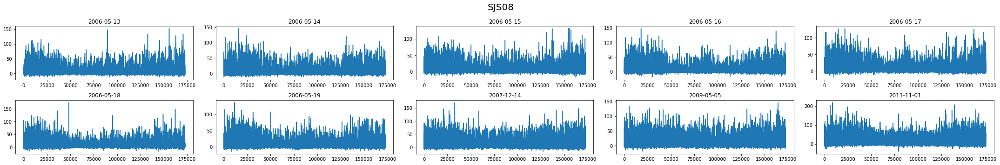

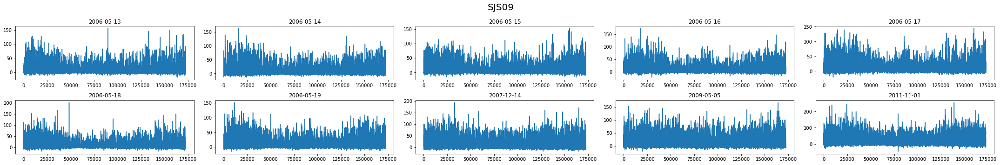

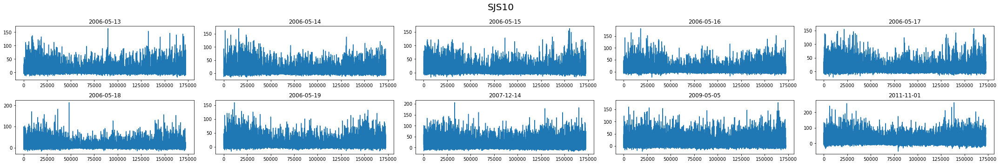

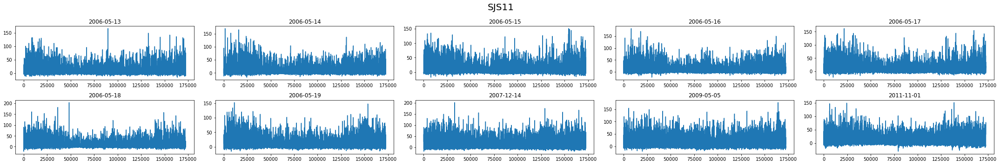

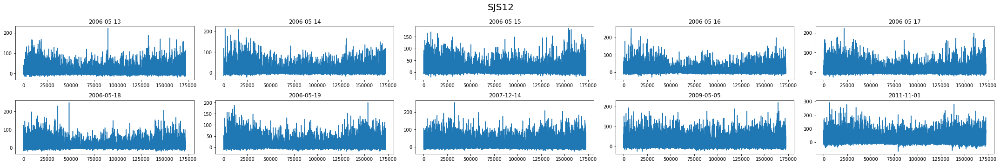

...

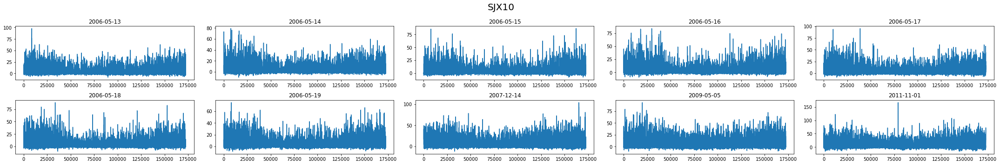

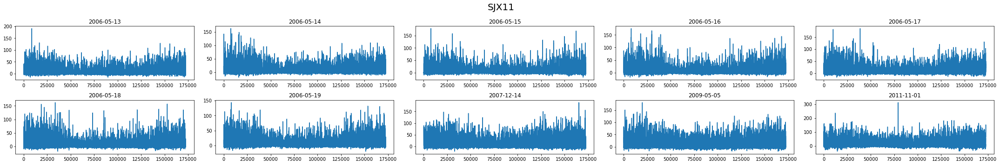

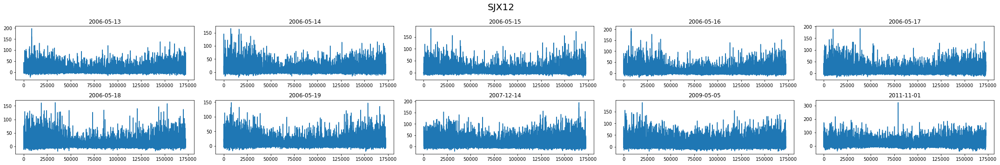

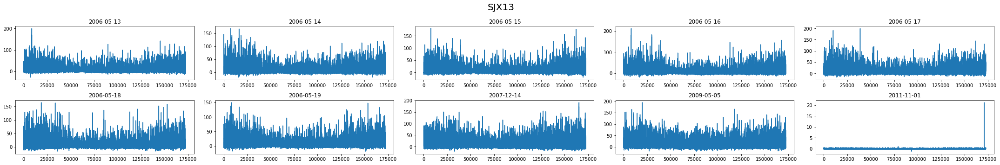

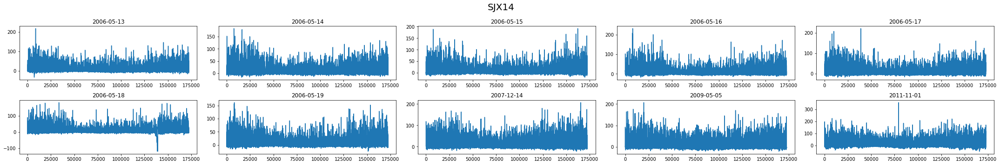

In [20]:
plot_data_by_cable(14, org_cable_diff_rolling, org_cable_title)

In [57]:
index = pd.date_range('2011-11-01', periods=172620, freq='0.5S')
index

DatetimeIndex([       '2011-11-01 00:00:00', '2011-11-01 00:00:00.500000',
                      '2011-11-01 00:00:01', '2011-11-01 00:00:01.500000',
                      '2011-11-01 00:00:02', '2011-11-01 00:00:02.500000',
                      '2011-11-01 00:00:03', '2011-11-01 00:00:03.500000',
                      '2011-11-01 00:00:04', '2011-11-01 00:00:04.500000',
               ...
                      '2011-11-01 23:58:25', '2011-11-01 23:58:25.500000',
                      '2011-11-01 23:58:26', '2011-11-01 23:58:26.500000',
                      '2011-11-01 23:58:27', '2011-11-01 23:58:27.500000',
                      '2011-11-01 23:58:28', '2011-11-01 23:58:28.500000',
                      '2011-11-01 23:58:29', '2011-11-01 23:58:29.500000'],
              dtype='datetime64[ns]', length=172620, freq='500L')

In [54]:
index = dates.date2num(index)
index = dates.DateFormatter('%H:%M')

In [55]:
index

In [67]:
org_cable_diff_rolling.shape

(10, 14, 172620)

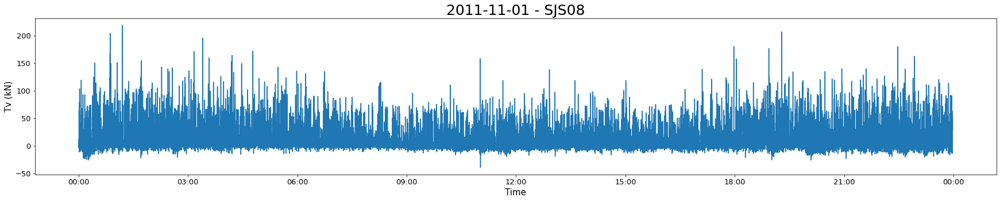

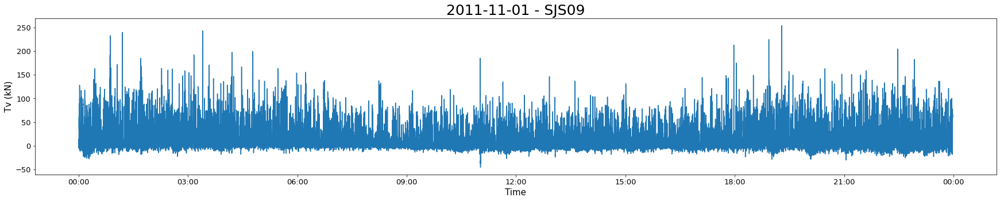

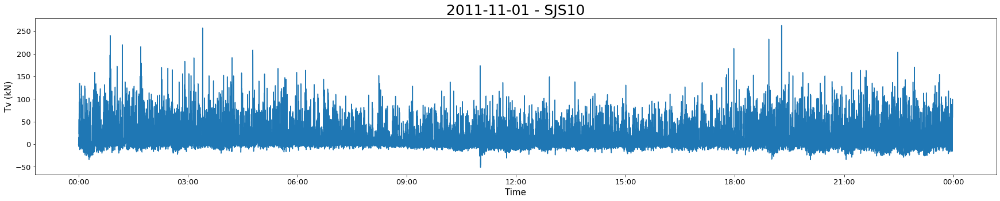

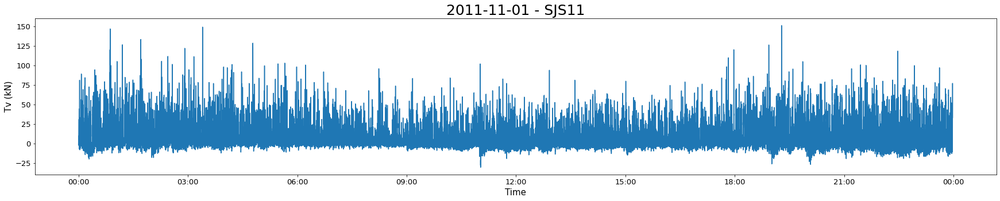

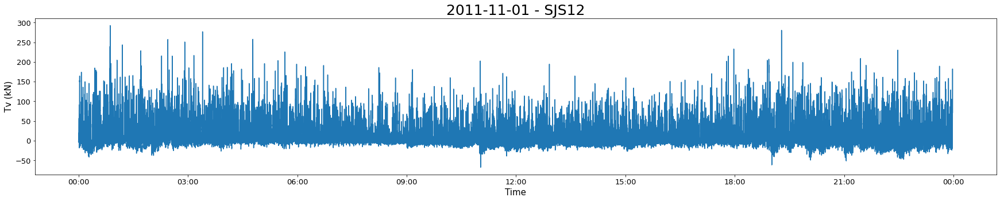

...

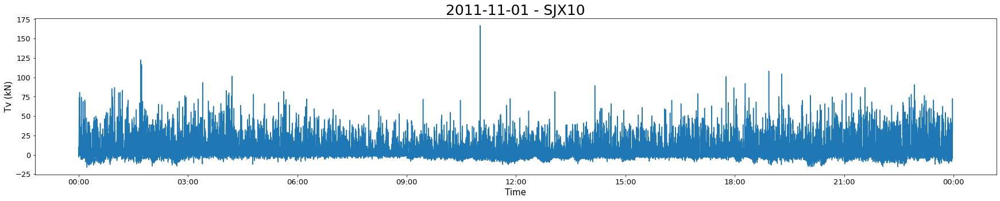

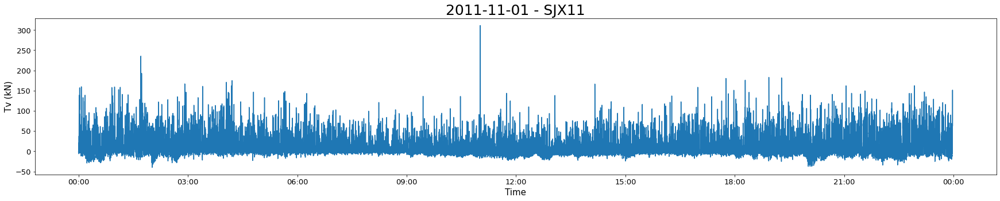

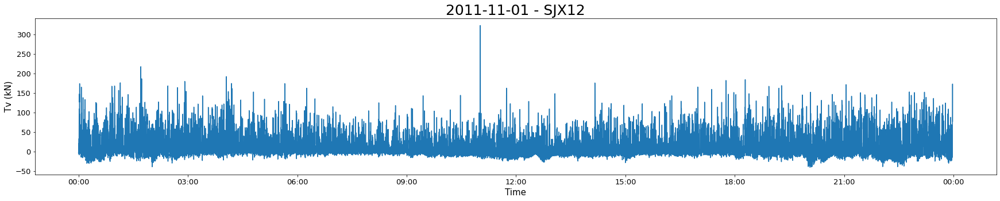

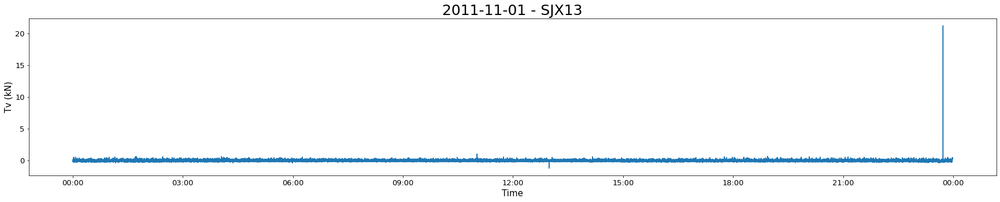

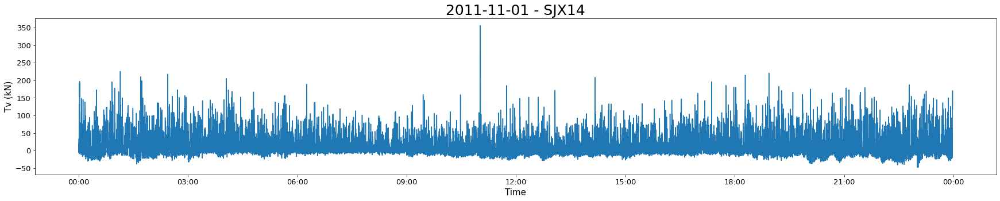

In [72]:
for i in range(14):
    fig = plt.figure(figsize=(30,5))
    ax = fig.add_subplot(111)
    ax.set_title('2011-11-01 - ' + org_cable_title[i], fontsize=25)
    ax.plot(index, org_cable_diff_rolling[-1][i])
    ax.xaxis.set_major_formatter(dates.DateFormatter('%H:%M'))
    plt.xlabel('Time', fontsize=15)
    plt.ylabel('Tv (kN)', fontsize=15)
    plt.xticks(fontsize=13)
    plt.yticks(fontsize=13)
    plt.show()

In [ ]:
fig, ax = plt.subplots(2, 5, figsize=(30,5))
num = 0
for j in range(2):
    for k in range(5):
        idx = num
        num += 1

        ax[j][k].set_title(file_names[idx])
        ax[j][k].plot(data[idx][i])
plt.suptitle(title[i], fontsize=20)
plt.tight_layout()
plt.show()

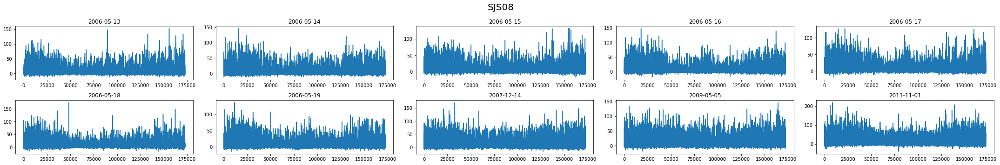

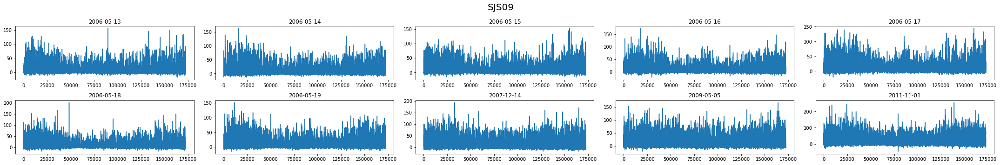

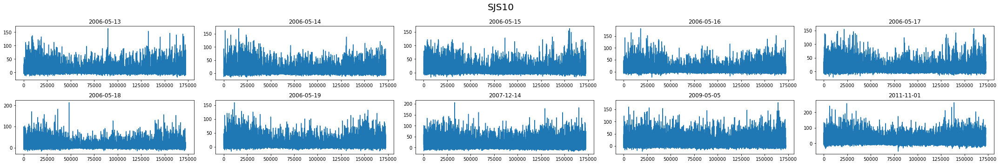

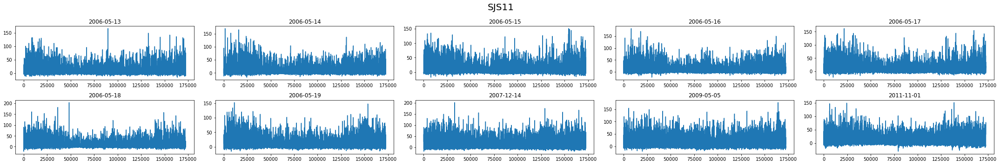

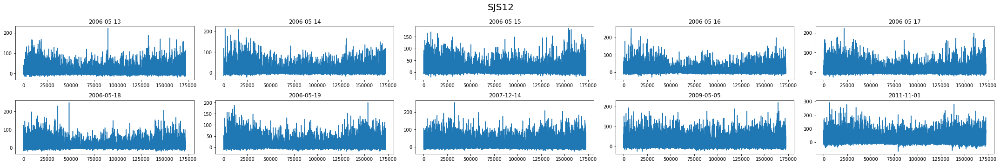

...

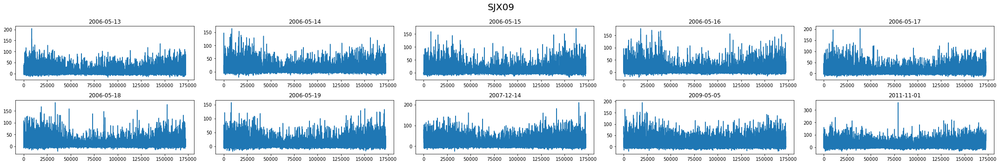

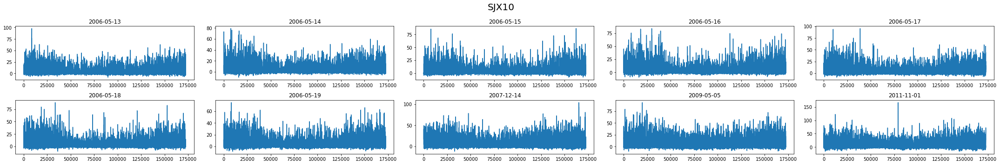

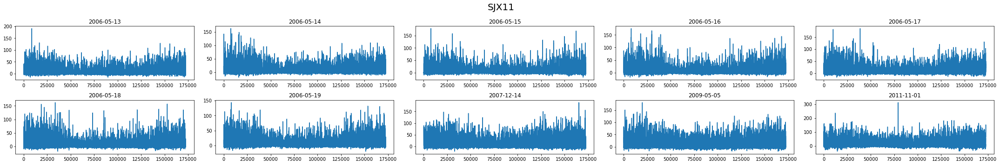

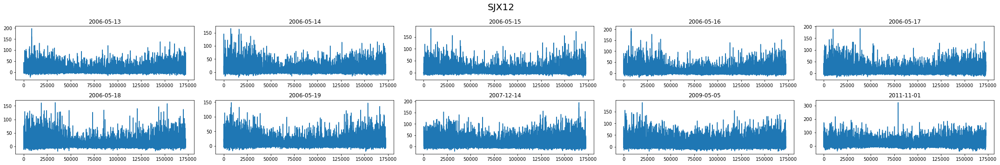

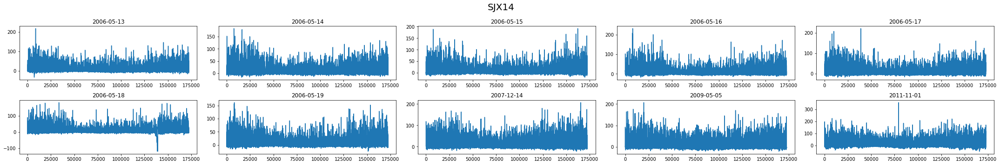

In [21]:
plot_data_by_cable(12, cable_diff_rolling, cable_title)

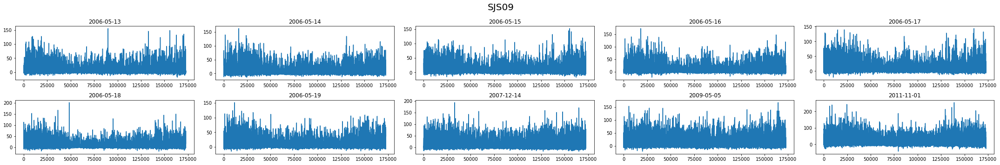

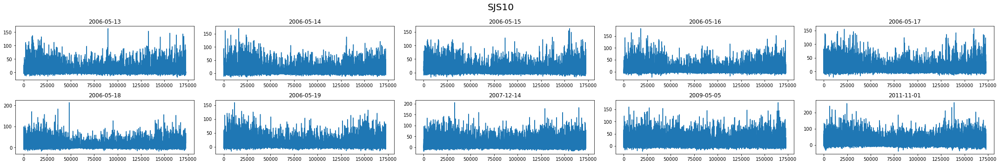

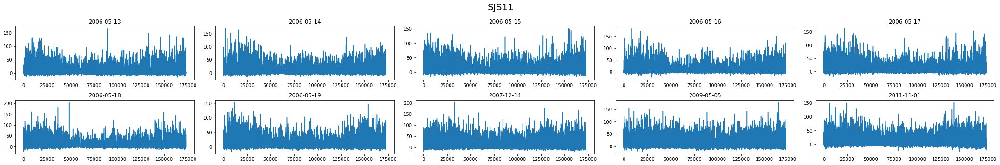

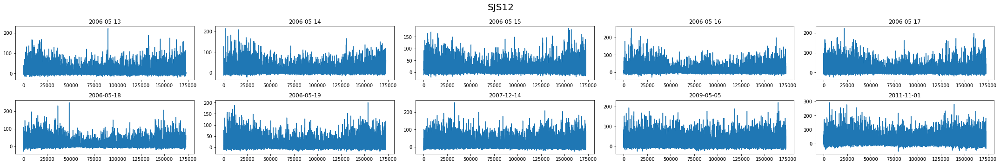

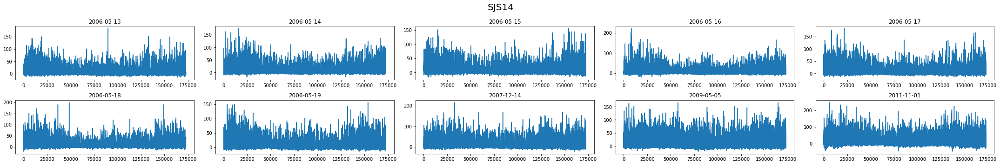

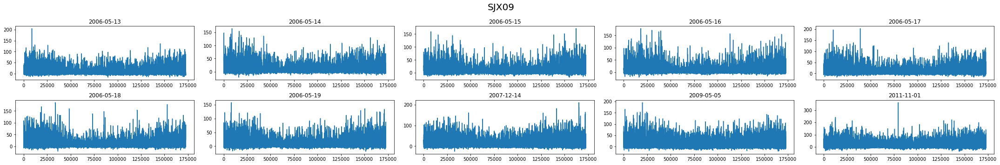

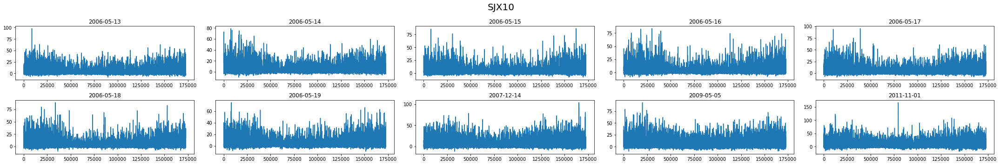

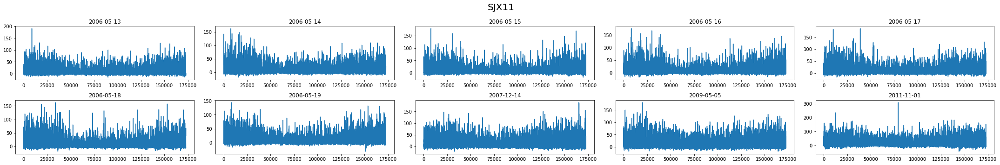

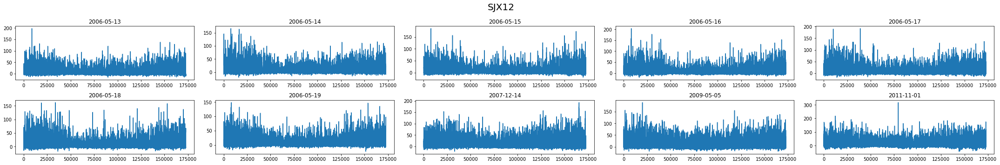

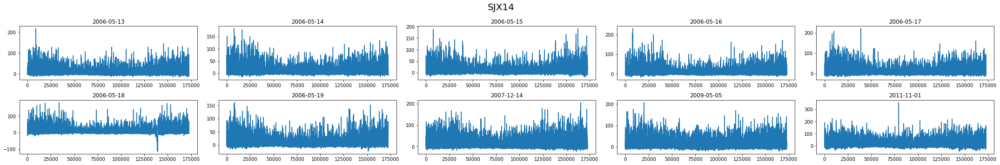

In [22]:
plot_data_by_cable(10, pre_cable_diff_rolling, pre_cable_title)

In [23]:
divide_cable = pre_cable_data
divide_cable.shape

(10, 10, 172800)

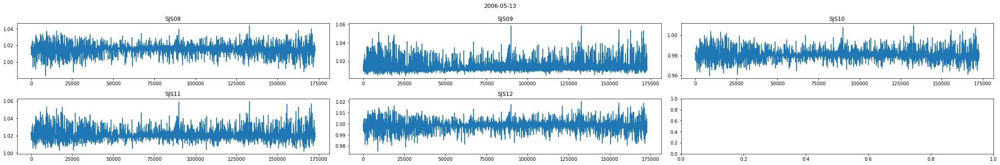

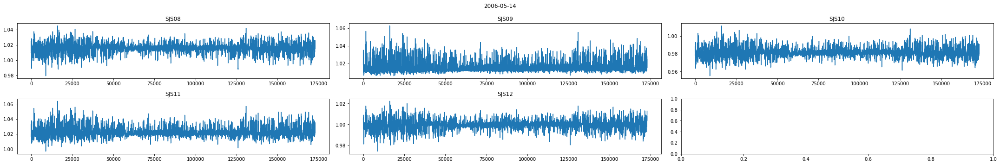

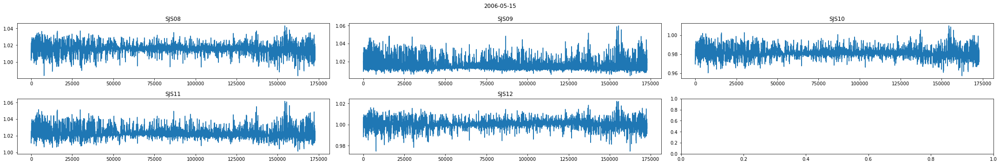

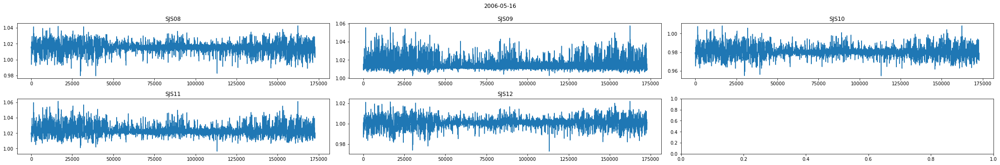

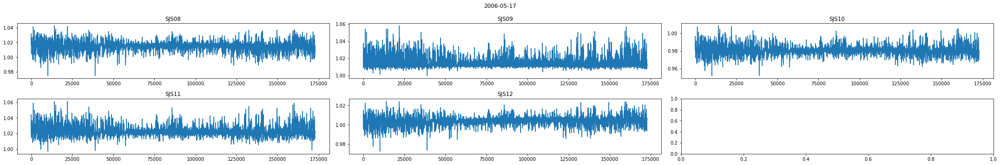

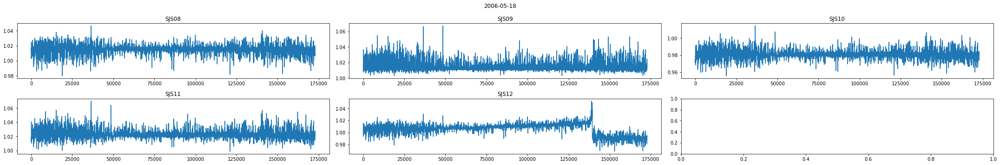

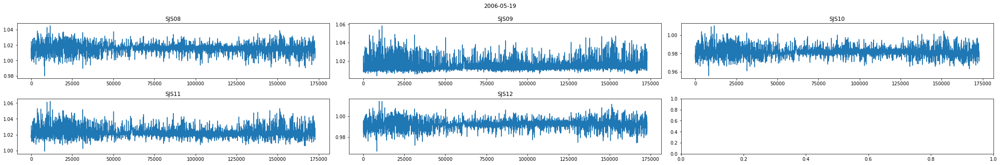

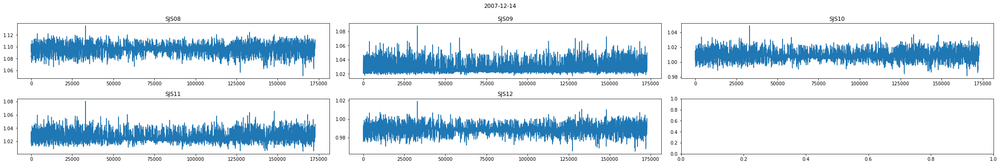

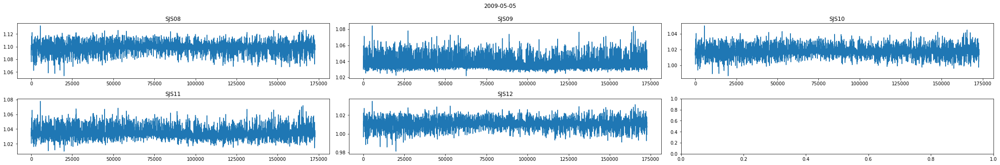

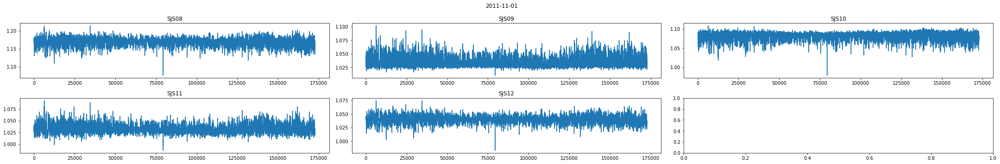

In [24]:
divide_list = []
for i in range(10):
    divide_list.append([])
    fig, ax = plt.subplots(2,3,figsize=(30,5))
    num = 0
    
    for j in range(2):
        for k in range(3):
            if num >= 5:
                break
            idx = num
            num += 1
            
            divide = divide_cable[i][idx]/divide_cable[i][idx+5]
            divide_list[i].append(divide)
            
            ax[j][k].set_title(cable_title[idx])
            ax[j][k].plot(divide)
    plt.suptitle(file_names[i])
    plt.tight_layout()
    plt.show()

In [25]:
divide_list = np.array(divide_list)
divide_list.shape

(10, 5, 172800)

In [41]:
term = cable_diff_rolling.shape[2] // 24
term

7192

In [56]:
split_cable_diff_rolling = []
for i in range(10):
    split_cable_diff_rolling.append([])
    for j in range(12):
        split_cable_diff_rolling[i].append([])
        for k in range(24):
            t = cable_diff_rolling[i][j][term*k:term*(k+1)]
            split_cable_diff_rolling[i][j].append(t)
split_cable_diff_rolling = np.array(split_cable_diff_rolling)
split_cable_diff_rolling.shape

(10, 12, 24, 7192)

In [64]:
term = divide_list.shape[2] // 24
term

7200

In [83]:
split_divide_list = []
for i in range(10):
    split_divide_list.append([])
    for j in range(5):
        split_divide_list[i].append([])
        for k in range(24):
            t = divide_list[i][j][term*k:term*(k+1)]
            split_divide_list[i][j].append(t)
split_divide_list = np.array(split_divide_list)
split_divide_list.shape

(10, 5, 24, 7200)

In [84]:
cable_trains = split_cable_diff_rolling.reshape(-1,24,split_cable_diff_rolling.shape[3])
cable_trains.shape

(120, 24, 7192)

In [85]:
divide_trains = split_divide_list.reshape(-1, 24, split_divide_list.shape[3])
divide_trains.shape

(50, 24, 7200)

In [86]:
from tslearn.clustering import TimeSeriesKMeans

In [93]:
cable_train = cable_diff_rolling.reshape(-1,cable_diff_rolling.shape[2])
cable_train.shape

(120, 172620)

In [94]:
divide_train = divide_list.reshape(-1, divide_list.shape[2])
divide_train.shape

(50, 172800)

### Euclidean

In [95]:
km = TimeSeriesKMeans(n_clusters = 2, verbose=False, random_state = 0)
y_pred = km.fit_predict(divide_train)
y_pred = y_pred.reshape(10, 5)
y_pred

array([[0, 0, 0, 0, 0],
       [0, 0, 0, 0, 0],
       [0, 0, 0, 0, 0],
       [0, 0, 0, 0, 0],
       [0, 0, 0, 0, 0],
       [0, 0, 0, 0, 0],
       [0, 0, 0, 0, 0],
       [1, 0, 0, 0, 0],
       [1, 0, 0, 0, 0],
       [1, 0, 1, 0, 0]], dtype=int64)

In [96]:
km = TimeSeriesKMeans(n_clusters = 3, verbose=False, random_state = 0)
y_pred = km.fit_predict(divide_train)
y_pred = y_pred.reshape(10, 5)
y_pred

array([[0, 0, 0, 0, 0],
       [0, 0, 0, 0, 0],
       [0, 0, 0, 0, 0],
       [0, 0, 0, 0, 0],
       [0, 0, 0, 0, 0],
       [0, 0, 0, 0, 0],
       [0, 0, 0, 0, 0],
       [2, 0, 0, 0, 0],
       [2, 0, 0, 0, 0],
       [1, 0, 2, 0, 0]], dtype=int64)

In [97]:
km = TimeSeriesKMeans(n_clusters = 2, verbose=False, random_state = 0)
y_pred = km.fit_predict(cable_train)
y_pred = y_pred.reshape(10, 12)
y_pred

array([[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0],
       [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0],
       [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0],
       [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0],
       [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0],
       [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0],
       [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0],
       [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0],
       [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0],
       [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]], dtype=int64)

In [98]:
km = TimeSeriesKMeans(n_clusters = 3, verbose=False, random_state = 0)
y_pred = km.fit_predict(cable_train)
y_pred = y_pred.reshape(10, 12)
y_pred

array([[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0],
       [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0],
       [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0],
       [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0],
       [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0],
       [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0],
       [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0],
       [2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2],
       [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0],
       [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]], dtype=int64)

### Mean

In [134]:
cable_mean = []
for i in range(120):
    cable_mean.append([])
    for j in range(400):
        x = cable_train[i][432*j:432*(j+1)]
        x = np.mean(x)
        cable_mean[i].append(x)
cable_mean = np.array(cable_mean)
cable_mean.shape

(120, 400)

In [129]:
divide_mean = []
for i in range(50):
    divide_mean.append([])
    for j in range(412):
        x = divide_train[i][420*j:420*(j+1)]
        x = np.mean(x)
        divide_mean[i].append(x)
divide_mean = np.array(divide_mean)
divide_mean.shape

(50, 412)

### DTW

In [126]:
km = TimeSeriesKMeans(n_clusters=2, metric="dtw", verbose=True, random_state=0)
y_pred = km.fit_predict(divide_mean)
y_pred = y_pred.reshape(10, 5)
y_pred

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done  50 out of  50 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 100 out of 100 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 100 out of 100 | elapsed:    0.1s finished


0.223 --> 

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 100 out of 100 | elapsed:    0.1s finished


0.106 --> 

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 100 out of 100 | elapsed:    0.1s finished


0.097 --> 

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 100 out of 100 | elapsed:    0.1s finished


0.096 --> 

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 100 out of 100 | elapsed:    0.1s finished


0.096 --> 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 100 out of 100 | elapsed:    0.1s finished


array([[0, 0, 0, 0, 0],
       [0, 0, 0, 0, 0],
       [0, 0, 0, 0, 0],
       [0, 0, 0, 0, 0],
       [0, 0, 0, 0, 0],
       [0, 0, 0, 0, 0],
       [0, 0, 0, 0, 0],
       [1, 0, 0, 0, 0],
       [1, 0, 0, 0, 0],
       [1, 0, 1, 0, 0]], dtype=int64)

In [127]:
km = TimeSeriesKMeans(n_clusters=3, metric="dtw", verbose=True, random_state=0)
y_pred = km.fit_predict(divide_mean)
y_pred = y_pred.reshape(10, 5)
y_pred

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done  50 out of  50 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 150 out of 150 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 150 out of 150 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 150 out of 150 | elapsed:    0.1s finished


0.095 --> 

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 150 out of 150 | elapsed:    0.2s finished


0.064 --> 

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 150 out of 150 | elapsed:    0.2s finished


0.064 --> 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 150 out of 150 | elapsed:    0.2s finished


array([[0, 0, 0, 0, 0],
       [0, 0, 0, 0, 0],
       [0, 0, 0, 0, 0],
       [0, 0, 0, 0, 0],
       [0, 0, 0, 0, 0],
       [0, 0, 0, 0, 0],
       [0, 0, 0, 0, 0],
       [2, 0, 0, 0, 0],
       [2, 0, 0, 0, 0],
       [1, 0, 2, 0, 0]], dtype=int64)

In [135]:
km = TimeSeriesKMeans(n_clusters=2, metric="dtw", verbose=True, random_state=0)
y_pred = km.fit_predict(cable_mean)
y_pred = y_pred.reshape(10, 12)
y_pred

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 120 out of 120 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 240 out of 240 | elapsed:    0.3s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 240 out of 240 | elapsed:    0.3s finished


5263.911 --> 

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 240 out of 240 | elapsed:    0.4s finished


3447.660 --> 

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 240 out of 240 | elapsed:    0.3s finished


3413.412 --> 

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 240 out of 240 | elapsed:    0.3s finished


3406.105 --> 

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 240 out of 240 | elapsed:    0.3s finished


3386.726 --> 

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 240 out of 240 | elapsed:    0.3s finished


3381.134 --> 

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 240 out of 240 | elapsed:    0.3s finished


3381.134 --> 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 240 out of 240 | elapsed:    0.3s finished


array([[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0],
       [0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0],
       [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0],
       [0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 1],
       [0, 0, 0, 0, 1, 0, 0, 1, 0, 0, 1, 1],
       [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1],
       [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0],
       [0, 1, 1, 1, 1, 0, 1, 1, 0, 1, 1, 1],
       [0, 0, 0, 0, 1, 0, 1, 1, 0, 1, 1, 1],
       [1, 1, 1, 0, 1, 0, 1, 1, 0, 1, 1, 1]], dtype=int64)

In [136]:
km = TimeSeriesKMeans(n_clusters=3, metric="dtw", verbose=True, random_state=0)
y_pred = km.fit_predict(cable_mean)
y_pred = y_pred.reshape(10, 12)
y_pred

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 120 out of 120 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 360 out of 360 | elapsed:    0.5s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 360 out of 360 | elapsed:    0.5s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 360 out of 360 | elapsed:    0.5s finished


4136.887 --> 

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 360 out of 360 | elapsed:    0.5s finished


3109.688 --> 

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 360 out of 360 | elapsed:    0.5s finished


3109.572 --> 

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 360 out of 360 | elapsed:    0.5s finished


3109.572 --> 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 360 out of 360 | elapsed:    0.5s finished


array([[0, 0, 2, 2, 2, 2, 2, 2, 0, 2, 2, 2],
       [0, 2, 2, 2, 2, 2, 2, 2, 0, 2, 2, 2],
       [0, 2, 2, 2, 2, 2, 2, 2, 0, 2, 2, 2],
       [0, 2, 2, 2, 2, 2, 2, 2, 0, 2, 2, 2],
       [0, 2, 2, 2, 2, 2, 2, 2, 0, 2, 2, 2],
       [0, 2, 2, 2, 2, 2, 2, 2, 0, 2, 2, 2],
       [0, 2, 2, 2, 2, 2, 2, 2, 0, 2, 2, 2],
       [2, 2, 1, 1, 1, 2, 1, 1, 0, 1, 1, 1],
       [2, 2, 2, 2, 1, 0, 2, 2, 0, 2, 2, 2],
       [1, 1, 1, 2, 1, 2, 1, 1, 2, 1, 1, 1]], dtype=int64)

In [148]:
cable_trains = split_cable_diff_rolling.reshape(-1,24,split_cable_diff_rolling.shape[3])
cable_trains.shape

(120, 24, 7192)

In [149]:
divide_trains = split_divide_list.reshape(-1, 24, split_divide_list.shape[3])
divide_trains.shape

(50, 24, 7200)

In [ ]:
fcm = FCM(n_clusters=2)
fcm.fit(divide_train)
y_pred = fcm.predict(divide_train)
y_pred = y_pred.reshape(10, 5)
y_pred

In [87]:
for i in range(24):
    cable_train = cable_trains[:,i]
    pre_cable_train = divide_trains[:,i]
    
    print(i)
    print('Diff')
    for k in range(2, 4):
        km = TimeSeriesKMeans(n_clusters = k, verbose=False, random_state=0)
        y_pred = km.fit_predict(pre_cable_train)
        y_pred = y_pred.reshape(10,5)
        print('K: ', k)
        print(y_pred)
        print('')
        
    print('\nDetrend')
    for k in range(2, 4):
        km = TimeSeriesKMeans(n_clusters = k, verbose=False, random_state=0)
        y_pred = km.fit_predict(cable_train)
        y_pred = y_pred.reshape(10, 12)
        print('K: ', k)
        print(y_pred)
        print('')
        
    print('\n\n')

0
Diff
K:  2
[[0 0 0 0 0]
 [0 0 0 0 0]
 [0 0 0 0 0]
 [0 0 0 0 0]
 [0 0 0 0 0]
 [0 0 0 0 0]
 [0 0 0 0 0]
 [1 0 0 0 0]
 [1 0 0 0 0]
 [1 0 1 0 0]]

K:  3
[[0 0 0 0 0]
 [0 0 0 0 0]
 [0 0 0 0 0]
 [0 0 0 0 0]
 [0 0 0 0 0]
 [0 0 0 0 0]
 [0 0 0 0 0]
 [2 0 0 0 0]
 [2 0 0 0 0]
 [1 0 2 0 0]]


Detrend
K:  2
[[0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0]
 [1 1 1 1 1 1 1 1 1 1 1 1]]

K:  3
[[0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0]
 [2 2 2 2 2 2 2 2 2 2 2 2]
 [0 0 0 0 0 0 0 0 0 0 0 0]
 [2 2 2 2 2 2 2 2 2 2 2 2]
 [0 0 0 0 0 0 0 0 0 0 0 0]
 [2 2 2 2 2 2 2 2 2 2 2 2]
 [2 2 2 2 2 2 2 2 2 2 2 2]
 [2 2 2 2 2 2 2 2 2 2 2 2]
 [1 1 1 1 1 1 1 1 1 1 1 1]]




1
Diff
K:  2
[[0 0 0 0 0]
 [0 0 0 0 0]
 [0 0 0 0 0]
 [0 0 0 0 0]
 [0 0 0 0 0]
 [0 0 0 0 0]
 [0 0 0 0 0]
 [1 0 0 0 0]
 [1 0 0 0 0]
 [1 0 1 0 0]]

K:  

K:  3
[[0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0]
 [2 2 2 2 1 1 1 2 2 2 2 1]]




10
Diff
K:  2
[[0 0 0 0 0]
 [0 0 0 0 0]
 [0 0 0 0 0]
 [0 0 0 0 0]
 [0 0 0 0 0]
 [0 0 0 0 0]
 [0 0 0 0 0]
 [1 0 0 0 0]
 [1 0 0 0 0]
 [1 0 1 0 0]]

K:  3
[[0 0 0 0 0]
 [0 0 0 0 0]
 [0 0 0 0 0]
 [0 0 0 0 0]
 [0 0 0 0 0]
 [0 0 0 0 0]
 [0 0 0 0 0]
 [2 0 0 0 0]
 [2 0 0 0 0]
 [1 0 2 0 0]]


Detrend
K:  2
[[0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0]
 [1 1 1 1 1 1 1 1 0 1 1 1]
 [0 0 0 0 0 0 0 0 0 0 0 0]]

K:  3
[[0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0

K:  3
[[0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0]
 [2 2 2 2 2 2 2 2 2 2 2 2]
 [0 0 0 0 0 0 0 0 0 0 0 0]
 [1 1 1 1 1 1 1 1 0 1 1 1]]




20
Diff
K:  2
[[0 0 0 0 0]
 [0 0 0 0 0]
 [0 0 0 0 0]
 [0 0 0 0 0]
 [0 0 0 0 0]
 [0 0 0 0 0]
 [0 0 0 0 0]
 [1 0 0 0 0]
 [1 0 0 0 0]
 [1 0 1 0 0]]

K:  3
[[0 0 0 0 0]
 [0 0 0 0 0]
 [0 0 0 0 0]
 [0 0 0 0 0]
 [0 0 0 0 0]
 [0 0 0 0 0]
 [0 0 0 0 0]
 [2 0 0 0 0]
 [2 0 0 0 0]
 [1 0 2 0 0]]


Detrend
K:  2
[[0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0]
 [1 1 1 1 1 1 1 1 1 1 1 1]]

K:  3
[[0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0

In [158]:
cable_mean = []
for i in range(120):
    cable_mean.append([])
    for j in range(24):
        cable_mean[i].append([])
        for k in range(899):
            x = cable_trains[i][j][8*k:8*(k+1)]
            x = np.mean(x)
            cable_mean[i][j].append(x)
cable_mean = np.array(cable_mean)
cable_mean.shape

(120, 24, 899)

In [160]:
divide_mean = []
for i in range(50):
    divide_mean.append([])
    for j in range(24):
        divide_mean[i].append([])
        for k in range(900):
            x = divide_trains[i][j][8*k:8*(k+1)]
            x = np.mean(x)
            divide_mean[i][j].append(x)
divide_mean = np.array(divide_mean)
divide_mean.shape

(50, 24, 900)

In [162]:
for i in range(24):
    cable_train = cable_mean[:,i]
    pre_cable_train = divide_mean[:,i]
    
    print(i)
    print('Diff')
    km = TimeSeriesKMeans(n_clusters=2, metric="dtw", verbose=False, random_state=0)
    y_pred = km.fit_predict(pre_cable_train)
    y_pred = y_pred.reshape(10,5)
    print('K: ', k)
    print(y_pred)
    print('')
        
    print('\nDetrend')
    km = TimeSeriesKMeans(n_clusters=2, metric="dtw", verbose=False, random_state=0)
    y_pred = km.fit_predict(cable_train)
    y_pred = y_pred.reshape(10, 12)
    print('K: ', k)
    print(y_pred)
    print('')
        
    print('\n\n')

0
Diff
K:  899
[[0 0 0 0 0]
 [0 0 0 0 0]
 [0 0 0 0 0]
 [0 0 0 0 0]
 [0 0 0 0 0]
 [0 0 0 0 0]
 [0 0 0 0 0]
 [1 0 0 0 0]
 [1 0 0 0 0]
 [1 0 1 0 0]]


Detrend
K:  899
[[0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0]
 [0 1 1 1 1 1 1 0 0 0 0 0]
 [0 0 0 0 1 0 0 0 0 0 0 0]
 [0 0 1 1 1 1 1 1 0 0 1 1]
 [0 0 1 1 1 1 1 1 0 1 1 1]
 [0 0 0 0 1 1 1 0 0 0 0 0]
 [0 1 1 1 1 0 1 1 0 1 1 1]
 [0 0 1 1 1 0 1 0 0 0 0 0]
 [1 1 1 1 1 1 1 1 0 1 1 1]]




1
Diff
K:  899
[[0 0 0 0 0]
 [0 0 0 0 0]
 [0 0 0 0 0]
 [0 0 0 0 0]
 [0 0 0 0 0]
 [0 0 0 0 0]
 [0 0 0 0 0]
 [1 0 0 0 0]
 [1 0 0 0 0]
 [1 0 0 0 0]]


Detrend
K:  899
[[0 1 1 1 1 1 1 1 0 1 1 1]
 [0 0 1 1 1 1 1 1 0 1 1 1]
 [0 0 0 0 1 0 0 0 0 0 0 1]
 [0 1 1 1 1 1 1 0 0 0 1 1]
 [0 1 1 1 1 1 1 1 0 1 1 1]
 [0 0 1 1 1 1 1 1 0 1 1 1]
 [0 1 1 1 1 1 1 1 0 1 1 1]
 [0 1 1 1 1 0 1 0 0 0 1 1]
 [0 0 0 0 1 0 1 1 0 1 1 1]
 [1 1 1 1 1 1 1 1 0 1 1 1]]




2
Diff
K:  899
[[0 0 0 0 0]
 [0 0 0 0 0]
 [0 0 0 0 0]
 [0 0 0 0 0]
 [0 0 0 0 0]
 [0 0 0 0 0]
 [0 0 0 0 0]
 [1 0 0 0 0]
 [1

K:  899
[[0 0 0 0 0]
 [0 0 0 0 0]
 [0 0 0 0 0]
 [0 0 0 0 0]
 [0 0 0 0 0]
 [0 0 0 0 0]
 [0 0 0 0 0]
 [1 0 0 0 0]
 [1 0 0 0 0]
 [1 0 1 0 0]]


Detrend
K:  899
[[0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 1 0 0 1 0 0 0 0]
 [0 0 1 1 1 1 1 0 0 0 0 1]
 [0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 1 0 0 1 0 1 1 1]
 [0 0 0 0 1 0 1 0 0 0 0 1]
 [1 1 1 1 1 1 1 1 0 1 1 1]]




20
Diff
K:  899
[[0 0 0 0 0]
 [0 0 0 0 0]
 [0 0 0 0 0]
 [0 0 0 0 0]
 [0 0 0 0 0]
 [0 0 0 0 0]
 [0 0 0 0 0]
 [1 0 0 0 0]
 [1 0 0 0 0]
 [1 0 1 0 0]]


Detrend
K:  899
[[0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 1 0 0 0 0 0 0 1]
 [0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 1 1 1 0 1 1 0 1 1 1]
 [0 1 1 1 1 0 1 0 0 0 1 1]
 [1 1 1 1 1 1 1 1 0 1 1 1]]




21
Diff
K:  899
[[0 0 0 0 0]
 [0 0 0 0 0]
 [0 0 0 0 0]
 [0 0 0 0 0]
 [0 0 0 0 0]
 [0 0 0 0 0]
 [0 0 0 0 0]
 [1 0 0 0 0]
 [1 0 0 

In [163]:
for i in range(24):
    cable_train = cable_mean[:,i]
    pre_cable_train = divide_mean[:,i]
    
    print(i)
    print('Diff')
    km = TimeSeriesKMeans(n_clusters=3, metric="dtw", verbose=False, random_state=0)
    y_pred = km.fit_predict(pre_cable_train)
    y_pred = y_pred.reshape(10,5)
    print('K: ', k)
    print(y_pred)
    print('')
        
    print('\nDetrend')
    km = TimeSeriesKMeans(n_clusters=3, metric="dtw", verbose=False, random_state=0)
    y_pred = km.fit_predict(cable_train)
    y_pred = y_pred.reshape(10, 12)
    print('K: ', k)
    print(y_pred)
    print('')
        
    print('\n\n')

0
Diff
K:  899
[[0 0 0 0 0]
 [0 0 0 0 0]
 [0 0 0 0 0]
 [0 0 0 0 0]
 [0 0 0 0 0]
 [0 0 0 0 0]
 [0 0 0 0 0]
 [2 0 0 0 0]
 [2 0 0 0 0]
 [1 0 2 0 0]]


Detrend
K:  899
[[0 2 2 2 2 2 2 2 0 2 2 2]
 [0 2 2 2 2 2 2 2 0 2 2 2]
 [2 2 2 2 1 2 2 2 0 2 2 2]
 [0 2 2 2 2 2 2 2 0 2 2 2]
 [2 2 2 2 2 2 2 2 0 2 2 2]
 [2 2 2 2 2 2 2 2 0 2 2 2]
 [2 2 2 2 2 2 2 2 0 2 2 2]
 [2 2 2 2 2 2 2 1 0 1 1 1]
 [2 2 2 2 1 0 2 2 0 2 2 2]
 [1 1 1 2 1 2 1 1 0 1 1 1]]




1
Diff
K:  899
[[0 0 0 0 0]
 [0 0 0 0 0]
 [0 0 0 0 0]
 [0 0 0 0 0]
 [0 0 0 0 0]
 [0 0 0 0 0]
 [0 0 0 0 0]
 [2 0 0 0 0]
 [2 0 0 0 0]
 [1 0 2 0 0]]


Detrend
K:  899
[[0 2 2 2 2 2 1 2 0 2 2 2]
 [0 0 1 1 1 1 1 1 0 1 1 1]
 [0 0 0 0 1 0 0 0 0 0 1 1]
 [1 1 1 1 1 1 1 1 0 1 1 1]
 [0 1 1 1 2 1 1 1 0 1 1 1]
 [0 0 2 2 2 1 1 1 0 1 1 2]
 [0 1 1 1 1 1 1 1 0 1 1 1]
 [0 1 1 1 1 0 1 1 0 1 1 1]
 [0 0 1 1 2 0 2 1 0 2 2 2]
 [2 2 2 2 2 2 2 2 0 2 2 2]]




2
Diff
K:  899
[[0 0 0 0 0]
 [0 0 0 0 0]
 [0 0 0 0 0]
 [0 0 0 0 0]
 [0 0 0 0 0]
 [0 0 0 0 0]
 [0 0 0 0 0]
 [2 0 0 0 0]
 [2

KeyboardInterrupt: 

In [164]:
for i in range(18, 21):
    cable_train = cable_mean[:,i]
    pre_cable_train = divide_mean[:,i]
    
    print(i)
    print('Diff')
    km = TimeSeriesKMeans(n_clusters=3, metric="dtw", verbose=False, random_state=0)
    y_pred = km.fit_predict(pre_cable_train)
    y_pred = y_pred.reshape(10,5)
    print('K: ', k)
    print(y_pred)
    print('')
        
    print('\nDetrend')
    km = TimeSeriesKMeans(n_clusters=3, metric="dtw", verbose=False, random_state=0)
    y_pred = km.fit_predict(cable_train)
    y_pred = y_pred.reshape(10, 12)
    print('K: ', k)
    print(y_pred)
    print('')
        
    print('\n\n')

18
Diff
K:  899
[[0 0 0 0 0]
 [0 0 0 0 0]
 [0 0 0 0 0]
 [0 0 0 0 0]
 [0 0 0 0 0]
 [0 0 0 0 0]
 [0 0 0 0 0]
 [2 0 0 0 0]
 [2 0 0 0 0]
 [1 0 2 0 0]]


Detrend
K:  899
[[0 2 2 2 2 2 2 2 0 2 2 2]
 [0 2 2 2 2 2 2 0 0 0 0 2]
 [0 0 0 0 2 0 0 0 0 0 0 0]
 [0 0 2 2 2 2 2 0 0 0 0 2]
 [0 2 2 2 2 2 2 2 0 2 2 2]
 [0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 2 2 2 2 0 0 2 2]
 [2 2 2 2 1 2 2 2 0 2 2 2]
 [0 2 2 2 1 0 1 2 0 2 2 2]
 [1 1 1 2 1 1 1 1 0 1 1 1]]




19
Diff
K:  899
[[0 0 0 0 0]
 [0 0 0 0 0]
 [0 0 0 0 0]
 [0 0 0 0 0]
 [0 0 0 0 0]
 [0 0 0 0 0]
 [0 0 0 0 0]
 [2 0 0 0 0]
 [2 0 0 0 0]
 [1 0 2 0 0]]


Detrend
K:  899
[[0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 2 2 2 2 2 0 0 0 0 0]
 [2 2 2 2 2 2 2 2 0 2 2 2]
 [2 2 2 2 2 2 2 2 0 2 2 1]
 [0 0 0 0 0 0 0 0 0 0 0 0]
 [2 2 2 2 2 2 2 2 0 2 2 2]
 [0 0 0 0 1 0 0 2 0 2 2 2]
 [1 1 1 2 1 1 1 1 0 1 1 1]]




20
Diff
K:  899
[[0 0 0 0 0]
 [0 0 0 0 0]
 [0 0 0 0 0]
 [0 0 0 0 0]
 [0 0 0 0 0]
 [0 0 0 0 0]
 [0 0 0 0 0]
 [2 0 0 0 0]
